[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1zLOEYO5wyd4ltmPDFeOVDgrSIIXdM14U?usp=sharing)

Jonathan Fernandes - https://www.linkedin.com/in/jonathanafernandes/

# Intro to Diffusion

In [ ]:
!pip install -qq -U datasets transformers accelerate ftfy pyarrow==9.0.0
!pip install diffusers[training]==0.11.1
!pip install diffusers==0.11.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 KB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 35.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 KB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 KB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 KB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 70.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 KB 10.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
!sudo apt -qq install git-lfs
!git config --global credential.helper store

git-lfs is already the newest version (2.9.2-1).
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.


In [ ]:
import numpy as np
import torch
import torch.nn.functional as F
from torchvision import transforms
from matplotlib import pyplot as plt
from PIL import Image
import torchvision
from diffusers import StableDiffusionPipeline, AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel, DDIMScheduler, DDPMPipeline
from tqdm.auto import tqdm
from datasets import load_dataset
import requests
from transformers import CLIPTokenizer, CLIPTextModel, CLIPModel, CLIPProcessor
import json
import re
import os

def show_images(x):
    """Given a batch of images x, make a grid and convert to PIL"""
    x = x * 0.5 + 0.5  # Map from (-1, 1) back to (0, 1)
    grid = torchvision.utils.make_grid(x)
    grid_im = grid.detach().cpu().permute(1, 2, 0).clip(0, 1) * 255
    grid_im = Image.fromarray(np.array(grid_im).astype(np.uint8))
    return grid_im


def make_grid(images, size=64):
    """Given a list of PIL images, stack them together into a line for easy viewing"""
    output_im = Image.new("RGB", (size * len(images), size))
    for i, im in enumerate(images):
        output_im.paste(im.resize((size, size)), (i * size, 0))
    return output_im


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

3 main components
- Pipelines
- Models
- Schedulers

- https://www.cs.toronto.edu/~kriz/cifar.html

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

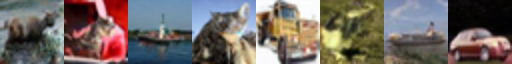

In [ ]:
from diffusers import DDPMPipeline

pipeline = DDPMPipeline.from_pretrained("google/ddpm-cifar10-32").to(device)

# Create 8 images
images = pipeline(batch_size=8).images

make_grid(images)

In [ ]:
import torchvision
from datasets import load_dataset
from torchvision import transforms

dataset = load_dataset("huggan/smithsonian_butterflies_subset", split="train")

image_size = 32 # smaller to reduce training time
batch_size = 64

preprocess = transforms.Compose(
    [
        transforms.Resize((image_size, image_size)),  # Resize
        transforms.RandomHorizontalFlip(),  # Randomly flip (data augmentation)
        transforms.ToTensor(),  # Convert to tensor (0, 1)
        transforms.Normalize([0.5], [0.5]),  # Map to (-1, 1)
    ]
)


def transform(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    return {"images": images}


dataset.set_transform(transform)

# Create a dataloader from the dataset to serve up the transformed images in batches
train_dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=batch_size, shuffle=True
)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/1000 [00:00<?, ? examples/s]

Dataset parquet downloaded and prepared to /root/.cache/huggingface/datasets/huggan___parquet/huggan--smithsonian_butterflies_subset-7665b1021a37404c/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec. Subsequent calls will reuse this data.


X shape: torch.Size([8, 3, 32, 32])


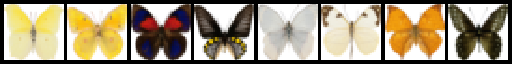

In [ ]:
batch = next(iter(train_dataloader))["images"].to(device)[:8]
print("X shape:", batch.shape)
show_images(batch).resize((8 * 64, 64), resample=Image.NEAREST)

## Scheduler

In [ ]:
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

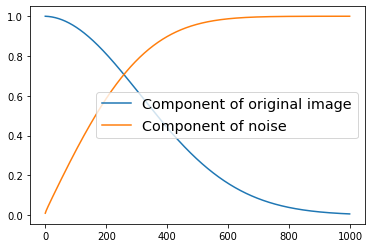

In [ ]:
original_image = noise_scheduler.alphas_cumprod.cpu() ** 0.5
noise = (1 - noise_scheduler.alphas_cumprod.cpu()) ** 0.5

plt.plot(original_image, label="Component of original image")
plt.plot(noise, label="Component of noise")
plt.legend(fontsize="x-large")

Noisy X shape torch.Size([8, 3, 32, 32])


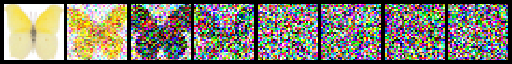

In [ ]:
timesteps = torch.linspace(0, 999, 8).long().to(device)
noise = torch.randn_like(batch)
noisy_batch = noise_scheduler.add_noise(batch, noise, timesteps)
print("Noisy X shape", noisy_batch.shape)
show_images(noisy_batch).resize((8 * 64, 64), resample=Image.NEAREST)

Controlling noise "scheduler" with beta parameters

Noisy X shape torch.Size([8, 3, 32, 32])


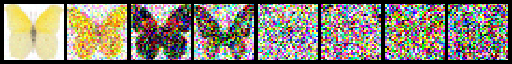

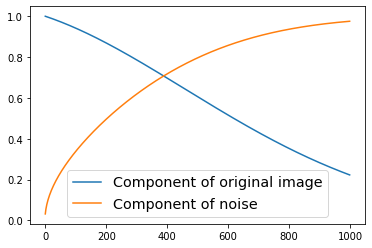

In [ ]:
#Low values for beta_end
noise_scheduler = DDPMScheduler(num_train_timesteps=1000, beta_start=0.001, beta_end=0.005)
original_image = noise_scheduler.alphas_cumprod.cpu() ** 0.5
noise = (1 - noise_scheduler.alphas_cumprod.cpu()) ** 0.5

plt.plot(original_image, label="Component of original image")
plt.plot(noise, label="Component of noise")
plt.legend(fontsize="x-large")

timesteps = torch.linspace(0, 999, 8).long().to(device)
noise = torch.randn_like(batch)
noisy_batch = noise_scheduler.add_noise(batch, noise, timesteps)
print("Noisy X shape", noisy_batch.shape)
show_images(noisy_batch).resize((8 * 64, 64), resample=Image.NEAREST)

Noisy X shape torch.Size([8, 3, 32, 32])


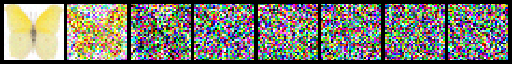

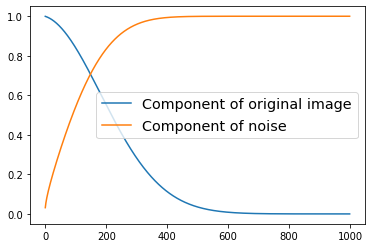

In [ ]:
#High values for beta_end
noise_scheduler = DDPMScheduler(num_train_timesteps=1000, beta_start=0.001, beta_end=0.05)
original_image = noise_scheduler.alphas_cumprod.cpu() ** 0.5
noise = (1 - noise_scheduler.alphas_cumprod.cpu()) ** 0.5

plt.plot(original_image, label="Component of original image")
plt.plot(noise, label="Component of noise")
plt.legend(fontsize="x-large")

timesteps = torch.linspace(0, 999, 8).long().to(device)
noise = torch.randn_like(batch)
noisy_batch = noise_scheduler.add_noise(batch, noise, timesteps)
print("Noisy X shape", noisy_batch.shape)
show_images(noisy_batch).resize((8 * 64, 64), resample=Image.NEAREST)

In [ ]:
DDPMScheduler?

Noisy X shape torch.Size([8, 3, 32, 32])


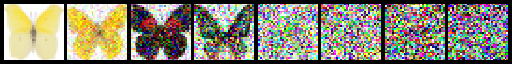

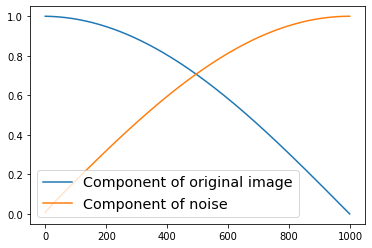

In [ ]:
noise_scheduler = DDPMScheduler(num_train_timesteps=1000, beta_schedule="squaredcos_cap_v2")
original_image = noise_scheduler.alphas_cumprod.cpu() ** 0.5
noise = (1 - noise_scheduler.alphas_cumprod.cpu()) ** 0.5

plt.plot(original_image, label="Component of original image")
plt.plot(noise, label="Component of noise")
plt.legend(fontsize="x-large")

timesteps = torch.linspace(0, 999, 8).long().to(device)
noise = torch.randn_like(batch)
noisy_batch = noise_scheduler.add_noise(batch, noise, timesteps)
print("Noisy X shape", noisy_batch.shape)
show_images(noisy_batch).resize((8 * 64, 64), resample=Image.NEAREST)

Noisy X shape torch.Size([8, 3, 32, 32])


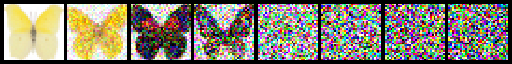

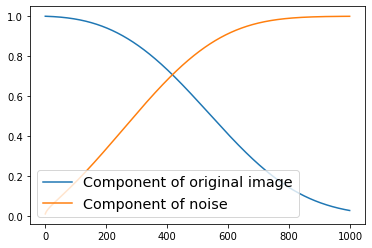

In [ ]:
noise_scheduler = DDPMScheduler(num_train_timesteps=1000, beta_schedule="scaled_linear")
original_image = noise_scheduler.alphas_cumprod.cpu() ** 0.5
noise = (1 - noise_scheduler.alphas_cumprod.cpu()) ** 0.5

plt.plot(original_image, label="Component of original image")
plt.plot(noise, label="Component of noise")
plt.legend(fontsize="x-large")

timesteps = torch.linspace(0, 999, 8).long().to(device)
noise = torch.randn_like(batch)
noisy_batch = noise_scheduler.add_noise(batch, noise, timesteps)
print("Noisy X shape", noisy_batch.shape)
show_images(noisy_batch).resize((8 * 64, 64), resample=Image.NEAREST)

In [ ]:
#back to default
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

In [ ]:
noise_scheduler.add_noise??

**[Back to slides - models]**

## model

In [ ]:
from diffusers import UNet2DModel

model = UNet2DModel(
    sample_size=image_size,  # the target image resolution
    in_channels=3,  # the number of input channels, 3 for RGB images
    out_channels=3,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(64, 128, 128, 256),  # More channels -> more parameters
    down_block_types=(
        "DownBlock2D",  # a regular ResNet downsampling block
        "DownBlock2D",
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "AttnDownBlock2D",
    ),
    up_block_types=(
        "AttnUpBlock2D",
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",
        "UpBlock2D",  # a regular ResNet upsampling block
    ),
)
model.to(device)

UNet2DModel(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0): ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
        (1): ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Con

In [ ]:
timesteps

tensor([  0, 142, 285, 428, 570, 713, 856, 999], device='cuda:0')

In [ ]:
noisy_batch.shape

torch.Size([8, 3, 32, 32])

In [ ]:
with torch.no_grad():
    model_prediction = model(noisy_batch, timesteps).sample

In [ ]:
# Confirm that UNET's input images are the same size as the output images
assert noisy_batch.shape == model_prediction.shape
print(f"Images are the same shape: {model_prediction.shape}")

Images are the same shape: torch.Size([8, 3, 32, 32])


## Train a model

**[Back to slides - model training]**

In [ ]:
model?

In [ ]:
#Big picture
num_epochs = 10
losses = []

for epoch in range(num_epochs):
  for step, batch in enumerate(train_dataloader):
    noisy_images = ...
    timesteps = ...
    noise_pred = model(noisy_images, timesteps)
    # loss calculations
    loss = F.mse_loss(noise_pred, noise)
    loss.backward()
    losses.append(loss.item())
    # Update optimizer 
    optimizer.step()
    optimizer.zero_grad()






    

AttributeError: ignored

In [ ]:
#build up to the for loop
noise_scheduler = DDPMScheduler(
    num_train_timesteps=1000, beta_schedule="squaredcos_cap_v2"
)

batch = next(iter(train_dataloader))
print(batch)

{'images': tensor([[[[ 0.0667, -0.2784, -0.0667,  ...,  0.9922,  0.9922,  1.0000],
          [-0.2471, -0.2706, -0.2549,  ...,  0.1765,  0.0510,  0.2627],
          [-0.1765, -0.1137, -0.0196,  ..., -0.3490, -0.3804, -0.3569],
          ...,
          [ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
          [ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
          [ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000]],

         [[-0.0196, -0.4196, -0.1843,  ...,  0.9922,  0.9843,  1.0000],
          [-0.4275, -0.5059, -0.4902,  ...,  0.1137, -0.0196,  0.2000],
          [-0.3804, -0.3804, -0.2784,  ..., -0.5529, -0.5843, -0.5373],
          ...,
          [ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
          [ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
          [ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000]],

         [[-0.1059, -0.5608, -0.3098,  ...,  0.9922,  0.9843,  0.9922],
          [-0.5922,

In [ ]:
batch["images"].shape

torch.Size([64, 3, 32, 32])

In [ ]:
clean_images = batch["images"].to(device)
clean_images.shape

torch.Size([64, 3, 32, 32])

In [ ]:
noise = torch.randn(clean_images.shape).to(device)
noise.shape

torch.Size([64, 3, 32, 32])

In [ ]:
bs = clean_images.shape[0]
timesteps = torch.randint(
            low=0, high=noise_scheduler.num_train_timesteps, size=(bs,), device=device).long()
timesteps

tensor([655, 967, 128, 845, 407, 289, 726,  41, 359, 716,  80, 276, 769, 986,
        286, 606, 852, 859, 787, 682, 450, 499, 107, 209, 973, 130, 722, 981,
        587, 295, 127, 901, 544, 146, 269, 769, 954, 843, 441, 770, 497, 840,
        163, 713, 822, 738, 246, 618, 452,  69, 311, 925,  60, 646, 733, 368,
        670, 294, 559, 523, 695, 127, 414, 795], device='cuda:0')

In [ ]:
timesteps.size()

torch.Size([64])

In [ ]:
noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)
noisy_images.shape

torch.Size([64, 3, 32, 32])

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=4e-4)

In [ ]:
noise_scheduler = DDPMScheduler(
    num_train_timesteps=1000, beta_schedule="squaredcos_cap_v2"
)

optimizer = torch.optim.AdamW(model.parameters(), lr=4e-4)

losses = []

for epoch in range(10):
    for step, batch in enumerate(train_dataloader):
        clean_images = batch["images"].to(device)
        # Sample noise to add to the images
        noise = torch.randn(clean_images.shape).to(device)
        bs = clean_images.shape[0]

        # Sample a random timestep for each image
        timesteps = torch.randint(
            0, noise_scheduler.num_train_timesteps, (bs,), device=device
        ).long()

        # Add noise to the clean images according to the noise magnitude at each timestep
        noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

        noise_pred = model(noisy_images, timesteps, return_dict=False)[0]

        loss = F.mse_loss(noise_pred, noise)
        loss.backward(loss)
        losses.append(loss.item())

        optimizer.step()
        optimizer.zero_grad()

    if (epoch + 1) % 2 == 0:
        loss_last_epoch = sum(losses[-len(train_dataloader) :]) / len(train_dataloader)
        print(f"Epoch:{epoch+1}, loss: {loss_last_epoch}")

Epoch:2, loss: 0.20852655731141567
Epoch:4, loss: 0.17170963529497385
Epoch:6, loss: 0.13386341510340571
Epoch:8, loss: 0.1260125613771379
Epoch:10, loss: 0.11613207682967186


## Generate Images - using a pipeline

In [ ]:
#Use a pretrained model
model = pipeline.unet

In [ ]:
from diffusers import DDPMPipeline

image_pipe = DDPMPipeline(unet=model, scheduler=noise_scheduler)

In [ ]:
output = image_pipe()
output

  0%|          | 0/1000 [00:00<?, ?it/s]

ImagePipelineOutput(images=[<PIL.Image.Image image mode=RGB size=32x32 at 0x7F037FA3BDC0>])

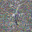

In [ ]:
output.images[0]

In [ ]:
len(output.images)

1

In [ ]:
image_pipe.save_pretrained("DDPM_pipeline")

In [ ]:
!ls -la DDPM_pipeline/

total 20
drwxr-xr-x 4 root root 4096 Mar  1 11:33 .
drwxr-xr-x 1 root root 4096 Mar  1 11:33 ..
-rw-r--r-- 1 root root  181 Mar  1 11:33 model_index.json
drwxr-xr-x 2 root root 4096 Mar  1 11:33 scheduler
drwxr-xr-x 2 root root 4096 Mar  1 11:33 unet


In [ ]:
!cat DDPM_pipeline/model_index.json

{
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.11.1",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}


In [ ]:
!ls -la DDPM_pipeline/unet

total 139772
drwxr-xr-x 2 root root      4096 Feb 28 22:02 .
drwxr-xr-x 4 root root      4096 Feb 28 22:02 ..
-rw-r--r-- 1 root root       905 Feb 28 22:02 config.json
-rw-r--r-- 1 root root 143112017 Feb 28 22:02 diffusion_pytorch_model.bin


In [ ]:
!cat DDPM_pipeline/unet/config.json

{
  "_class_name": "UNet2DModel",
  "_diffusers_version": "0.11.1",
  "_name_or_path": "/root/.cache/huggingface/diffusers/models--google--ddpm-cifar10-32/snapshots/ff056c9de317d5b9ced74e0886174801c2ecb5fb",
  "act_fn": "silu",
  "add_attention": true,
  "attention_head_dim": null,
  "block_out_channels": [
    128,
    256,
    256,
    256
  ],
  "center_input_sample": false,
  "down_block_types": [
    "DownBlock2D",
    "AttnDownBlock2D",
    "DownBlock2D",
    "DownBlock2D"
  ],
  "downsample_padding": 0,
  "flip_sin_to_cos": false,
  "freq_shift": 1,
  "in_channels": 3,
  "layers_per_block": 2,
  "mid_block_scale_factor": 1,
  "norm_eps": 1e-06,
  "norm_num_groups": 32,
  "out_channels": 3,
  "resnet_time_scale_shift": "default",
  "sample_size": 32,
  "time_embedding_type": "positional",
  "up_block_types": [
    "UpBlock2D",
    "UpBlock2D",
    "AttnUpBlock2D",
    "UpBlock2D"
  ]
}


In [ ]:
!ls -la DDPM_pipeline/scheduler

total 12
drwxr-xr-x 2 root root 4096 Feb 28 22:02 .
drwxr-xr-x 4 root root 4096 Feb 28 22:02 ..
-rw-r--r-- 1 root root  300 Feb 28 22:02 scheduler_config.json


In [ ]:
!cat DDPM_pipeline/scheduler/scheduler_config.json

{
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.11.1",
  "beta_end": 0.02,
  "beta_schedule": "squaredcos_cap_v2",
  "beta_start": 0.0001,
  "clip_sample": true,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "trained_betas": null,
  "variance_type": "fixed_small"
}


## What is happening in an image pipeline?

In [ ]:
image_pipe.__call__??

In [ ]:
# start with timesteps that are noisy. End up with no noise
noise_scheduler.timesteps

tensor([999, 998, 997, 996, 995, 994, 993, 992, 991, 990, 989, 988, 987, 986,
        985, 984, 983, 982, 981, 980, 979, 978, 977, 976, 975, 974, 973, 972,
        971, 970, 969, 968, 967, 966, 965, 964, 963, 962, 961, 960, 959, 958,
        957, 956, 955, 954, 953, 952, 951, 950, 949, 948, 947, 946, 945, 944,
        943, 942, 941, 940, 939, 938, 937, 936, 935, 934, 933, 932, 931, 930,
        929, 928, 927, 926, 925, 924, 923, 922, 921, 920, 919, 918, 917, 916,
        915, 914, 913, 912, 911, 910, 909, 908, 907, 906, 905, 904, 903, 902,
        901, 900, 899, 898, 897, 896, 895, 894, 893, 892, 891, 890, 889, 888,
        887, 886, 885, 884, 883, 882, 881, 880, 879, 878, 877, 876, 875, 874,
        873, 872, 871, 870, 869, 868, 867, 866, 865, 864, 863, 862, 861, 860,
        859, 858, 857, 856, 855, 854, 853, 852, 851, 850, 849, 848, 847, 846,
        845, 844, 843, 842, 841, 840, 839, 838, 837, 836, 835, 834, 833, 832,
        831, 830, 829, 828, 827, 826, 825, 824, 823, 822, 821, 8

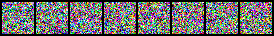

In [ ]:
sample = torch.randn(8, 3, 32, 32).to(device)
show_images(sample)

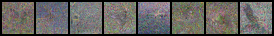

In [ ]:
for _, timestamp in enumerate(noise_scheduler.timesteps):

    # Get model pred
    with torch.no_grad():
        residual = model(sample, timestamp).sample

    # Update sample with step
    sample = noise_scheduler.step(residual, timestamp, sample).prev_sample

show_images(sample)

In [ ]:
noise_scheduler.step??

- https://nn.labml.ai/diffusion/stable_diffusion/sampler/ddpm.html

# Inference with diffusers

## Pipelines

### DDPM

In [ ]:
from diffusers import DDPMPipeline

In [ ]:
image_pipe = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")
image_pipe.to("cuda")

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

DDPMPipeline {
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.11.1",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

In [ ]:
images = image_pipe().images
images

  0%|          | 0/1000 [00:00<?, ?it/s]

[<PIL.Image.Image image mode=RGB size=256x256 at 0x7F036DF44640>]

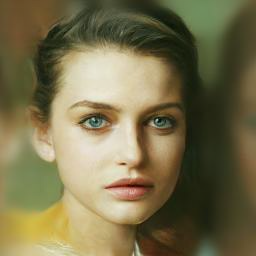

In [ ]:
images[0]

### Models

In [ ]:
import numpy as np
import torch
import torch.nn.functional as F
from matplotlib import pyplot as plt
from PIL import Image
import torchvision
from diffusers import UNet2DModel

def show_images(x):
    """Given a batch of images x, make a grid and convert to PIL"""
    x = x * 0.5 + 0.5  # Map from (-1, 1) back to (0, 1)
    grid = torchvision.utils.make_grid(x)
    grid_im = grid.detach().cpu().permute(1, 2, 0).clip(0, 1) * 255
    grid_im = Image.fromarray(np.array(grid_im).astype(np.uint8))
    return grid_im

In [ ]:
repo_id = "google/ddpm-church-256"
repo_id = "google/ddpm-celebahq-256"

model = UNet2DModel.from_pretrained(repo_id)
model

UNet2DModel(
  (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0): ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
        (1): ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (c

In [ ]:
model.config

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('act_fn', 'silu'),
            ('attention_head_dim', None),
            ('norm_num_groups', 32),
            ('norm_eps', 

In [ ]:
torch.manual_seed(0)

noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)
noisy_sample.shape

torch.Size([1, 3, 256, 256])

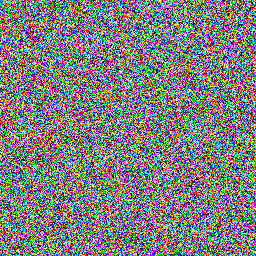

In [ ]:
show_images(noisy_sample)

In [ ]:
with torch.no_grad():
    noisy_residual = model(sample=noisy_sample, timestep=2).sample

noisy_residual.shape

torch.Size([1, 3, 256, 256])

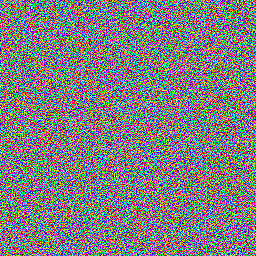

In [ ]:
show_images(noisy_residual)

### Scheduler (DDIM)

Denoising Diffusion Implicit Models - More efficient and faster way to generate images.
- Estimate multiple steps and do that all at once, rather than DDPM which does one step at a time.
- https://arxiv.org/abs/2010.02502

In [ ]:
from diffusers import DDIMScheduler
import torch

In [ ]:
repo_id = "google/ddpm-church-256"
repo_id = "google/ddpm-celebahq-256"

scheduler = DDIMScheduler.from_config(repo_id)
scheduler.set_timesteps(num_inference_steps=50)
scheduler.config

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.0001),
            ('beta_end', 0.02),
            ('beta_schedule', 'linear'),
            ('trained_betas', None),
            ('clip_sample', True),
            ('set_alpha_to_one', True),
            ('steps_offset', 0),
            ('prediction_type', 'epsilon'),
            ('_class_name', 'DDPMScheduler'),
            ('_diffusers_version', '0.1.1'),
            ('variance_type', 'fixed_small')])

In [ ]:
noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)
noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [ ]:
less_noisy_sample = scheduler.step(
    model_output=noisy_residual, timestep=2, sample=noisy_sample
).prev_sample

less_noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [ ]:
import PIL.Image
import numpy as np

def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {i}")
    display(image_pil)

 18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

'Image at step 10'

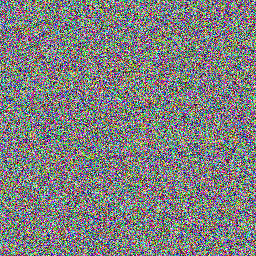

 38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

'Image at step 20'

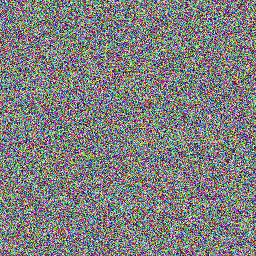

 58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

'Image at step 30'

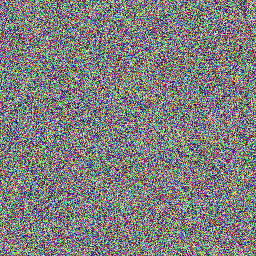

 78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

'Image at step 40'

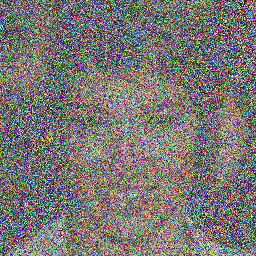

 98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

'Image at step 50'

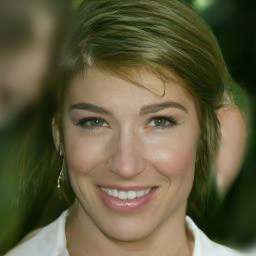

100%|██████████| 50/50 [00:06<00:00,  7.94it/s]


In [ ]:
import tqdm

model.to("cuda")
noisy_sample = noisy_sample.to("cuda")

sample = noisy_sample

for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
  # 1. predict noise residual
  with torch.no_grad():
      residual = model(sample, t).sample

  # 2. compute previous image and set x_t -> x_t-1
  sample = scheduler.step(residual, t, sample).prev_sample

  # 3. optionally look at image
  if (i + 1) % 10 == 0:
      display_sample(sample, i + 1)


## Fine-tuning diffusers

In [ ]:
image_pipe = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")
image_pipe.to(device)

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

DDPMPipeline {
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.11.1",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

In [ ]:
scheduler = DDIMScheduler.from_pretrained("google/ddpm-celebahq-256")
scheduler.set_timesteps(num_inference_steps=40)

In [ ]:
scheduler.timesteps

tensor([975, 950, 925, 900, 875, 850, 825, 800, 775, 750, 725, 700, 675, 650,
        625, 600, 575, 550, 525, 500, 475, 450, 425, 400, 375, 350, 325, 300,
        275, 250, 225, 200, 175, 150, 125, 100,  75,  50,  25,   0])

0it [00:00, ?it/s]

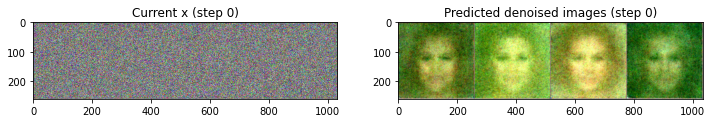

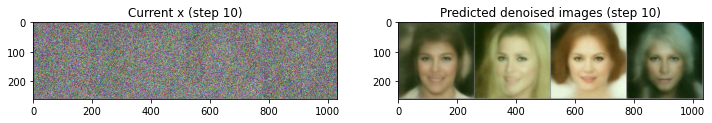

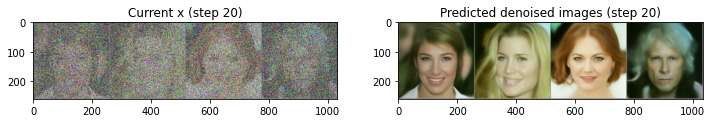

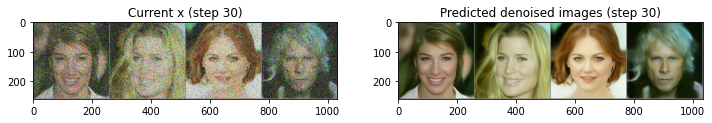

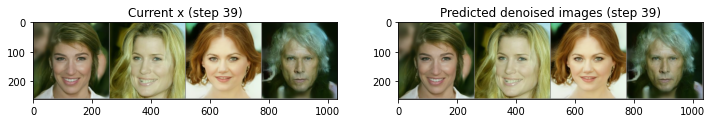

In [ ]:
x = torch.randn(4, 3, 256, 256).to(device)  # Batch of 4, 3-channel 256 x 256 px images

for i, t in tqdm(enumerate(scheduler.timesteps)):

    model_input = scheduler.scale_model_input(x, t)

    with torch.no_grad():
        noise_pred = image_pipe.unet(model_input, t)["sample"]

    scheduler_output = scheduler.step(noise_pred, t, x)

    x = scheduler_output.prev_sample

    if i % 10 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        grid = torchvision.utils.make_grid(x, nrow=4).permute(1, 2, 0)
        axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
        axs[0].set_title(f"Current x (step {i})")

        pred_x0 = (
            scheduler_output.pred_original_sample
        )  # Not available for all schedulers
        grid = torchvision.utils.make_grid(pred_x0, nrow=4).permute(1, 2, 0)
        axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
        axs[1].set_title(f"Predicted denoised images (step {i})")
        plt.show()

In [ ]:
dataset_name = "huggan/selfie2anime"
dataset = load_dataset(dataset_name, split="train")
dataset

Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/3400 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/100 [00:00<?, ? examples/s]

Dataset parquet downloaded and prepared to /root/.cache/huggingface/datasets/huggan___parquet/huggan--selfie2anime-2601eb6cdec450c3/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec. Subsequent calls will reuse this data.


Dataset({
    features: ['imageA', 'imageB'],
    num_rows: 3400
})

In [ ]:
dataset = dataset.shuffle(seed=1).select(range(100))
dataset

Dataset({
    features: ['imageA', 'imageB'],
    num_rows: 100
})

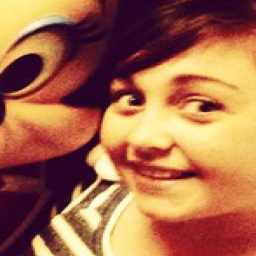

In [ ]:
dataset[0]["imageA"]

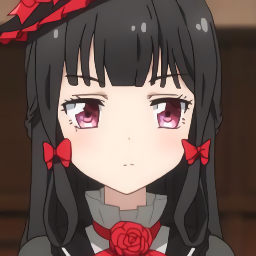

In [ ]:
dataset[0]["imageB"]

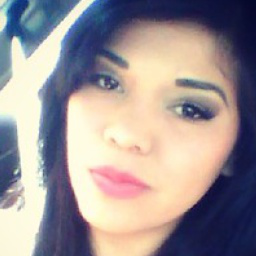

In [ ]:
dataset[1]["imageA"]

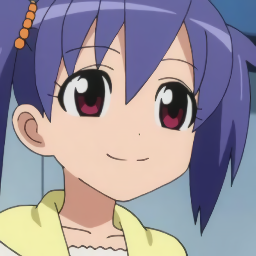

In [ ]:
dataset[1]["imageB"]

In [ ]:
type(dataset[0]["imageB"])

PIL.PngImagePlugin.PngImageFile

In [ ]:
image_size = 256
batch_size = 4  
preprocess = transforms.Compose(
    [
        transforms.Resize((image_size, image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

In [ ]:
def transform(batch):
    images = [preprocess(image.convert("RGB")) for image in batch["imageB"]]
    return {"images": images}

In [ ]:
dataset.set_transform(transform)

Previewing batch:


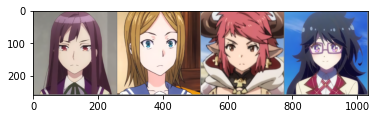

In [ ]:
train_dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=batch_size, shuffle=True
)

print("Previewing batch:")
batch = next(iter(train_dataloader))
grid = torchvision.utils.make_grid(batch["images"], nrow=4)
plt.imshow(grid.permute(1, 2, 0).cpu().clip(-1, 1) * 0.5 + 0.5)

In [ ]:
num_epochs = 50  # 
lr = 1e-5  # 2param
grad_accumulation_steps = 4  # 

optimizer = torch.optim.AdamW(image_pipe.unet.parameters(), lr=lr)

losses = []

for epoch in range(num_epochs):
    for step, batch in tqdm(enumerate(train_dataloader), total=len(train_dataloader)):
        clean_images = batch["images"].to(device)
        # Sample noise to add to the images
        noise = torch.randn(clean_images.shape).to(clean_images.device)
        bs = clean_images.shape[0]

        # Sample a random timestep for each image
        timesteps = torch.randint(
            0,
            image_pipe.scheduler.num_train_timesteps,
            (bs,),
            device=clean_images.device,
        ).long()

        # Add noise to the clean images according to the noise magnitude at each timestep
        # (this is the forward diffusion process)
        noisy_images = image_pipe.scheduler.add_noise(clean_images, noise, timesteps)

        # Get the model prediction for the noise
        noise_pred = image_pipe.unet(noisy_images, timesteps, return_dict=False)[0]

        # Compare the prediction with the actual noise:
        loss = F.mse_loss(
            noise_pred, noise
        )  # NB - trying to predict noise (eps) not (noisy_ims-clean_ims) or just (clean_ims)

        # Store for later plotting
        losses.append(loss.item())

        # Update the model parameters with the optimizer based on this loss
        loss.backward(loss)

        # Gradient accumulation:
        if (step + 1) % grad_accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()

    print(
        f"Epoch {epoch} average loss: {sum(losses[-len(train_dataloader):])/len(train_dataloader)}"
    )

# Plot the loss curve:
plt.plot(losses)

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch 0 average loss: 0.013917241778108292


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1 average loss: 0.014258852901402861


  0%|          | 0/25 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

0it [00:00, ?it/s]

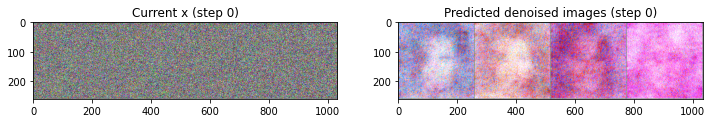

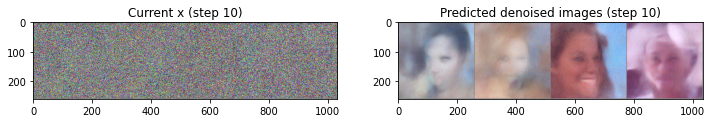

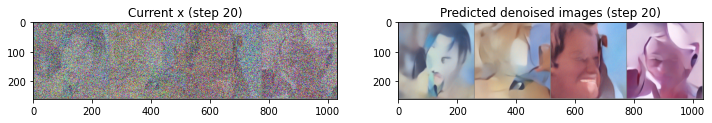

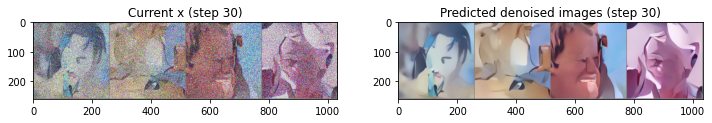

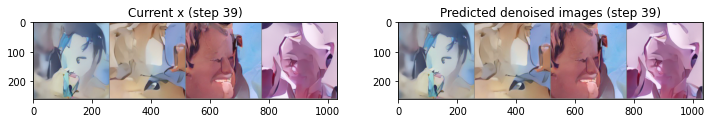

In [ ]:
x = torch.randn(4, 3, 256, 256).to(device)  # Batch of 4, 3-channel 256 x 256 px images

for i, t in tqdm(enumerate(scheduler.timesteps)):

    model_input = scheduler.scale_model_input(x, t)

    with torch.no_grad():
        noise_pred = image_pipe.unet(model_input, t)["sample"]

    scheduler_output = scheduler.step(noise_pred, t, x)

    x = scheduler_output.prev_sample

    if i % 10 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        grid = torchvision.utils.make_grid(x, nrow=4).permute(1, 2, 0)
        axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
        axs[0].set_title(f"Current x (step {i})")

        pred_x0 = (
            scheduler_output.pred_original_sample
        )  # Not available for all schedulers
        grid = torchvision.utils.make_grid(pred_x0, nrow=4).permute(1, 2, 0)
        axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
        axs[1].set_title(f"Predicted denoised images (step {i})")
        plt.show()

In [ ]:
model_folder = "celebahq_finetuned_model"
image_pipe.save_pretrained(f"{model_folder}")

In [ ]:
!ls -la {model_folder}

total 20
drwxr-xr-x 4 root root 4096 Mar  1 11:50 .
drwxr-xr-x 1 root root 4096 Mar  1 11:50 ..
-rw-r--r-- 1 root root  181 Mar  1 11:50 model_index.json
drwxr-xr-x 2 root root 4096 Mar  1 11:50 scheduler
drwxr-xr-x 2 root root 4096 Mar  1 11:50 unet


In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
!sudo apt -qq install git-lfs
!git config --global credential.helper store

git-lfs is already the newest version (2.9.2-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 21 not upgraded.


In [ ]:
from huggingface_hub import HfApi, ModelCard, create_repo, get_full_repo_name

# Set up repo and upload files
model_name = f"ddpm-celebahq-finetuned-anime-{num_epochs}" 
hub_model_id = get_full_repo_name(model_name)
create_repo(hub_model_id)

RepoUrl('https://huggingface.co/jonathanfernandes/ddpm-celebahq-finetuned-anime-50', endpoint='https://huggingface.co', repo_type='model', repo_id='jonathanfernandes/ddpm-celebahq-finetuned-anime-50')

In [ ]:
api = HfApi()
api.upload_folder(
    folder_path=f"{model_folder}/scheduler", path_in_repo="", repo_id=hub_model_id
)
api.upload_folder(
    folder_path=f"{model_folder}/unet", path_in_repo="", repo_id=hub_model_id
)
api.upload_file(
    path_or_fileobj=f"{model_folder}/model_index.json",
    path_in_repo="model_index.json",
    repo_id=hub_model_id,
)

diffusion_pytorch_model.bin:   0%|          | 0.00/455M [00:00<?, ?B/s]

Upload 1 LFS files:   0%|          | 0/1 [00:00<?, ?it/s]

'https://huggingface.co/jonathanfernandes/ddpm-celebahq-finetuned-anime-50/blob/main/model_index.json'

In [ ]:
# 100 epochs
model_id = "jonathanfernandes/ddpm-celebahq-finetuned-anime-100"
scheduler = DDIMScheduler.from_pretrained(model_id)
scheduler.set_timesteps(num_inference_steps=40)

0it [00:00, ?it/s]

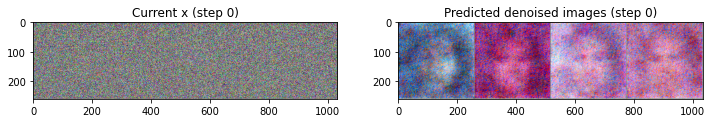

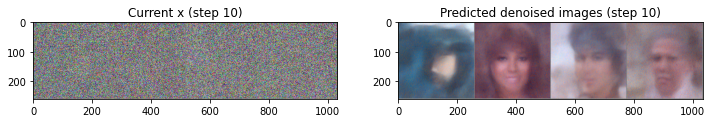

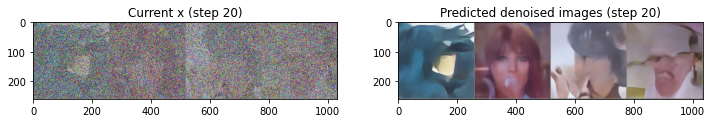

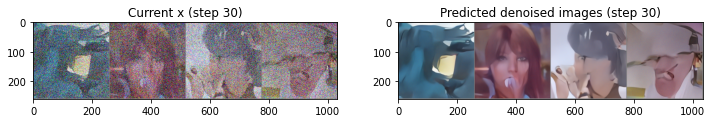

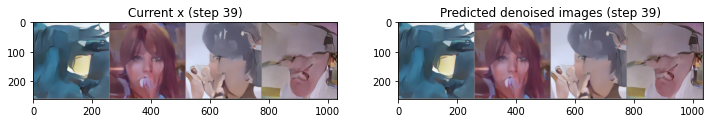

In [ ]:
x = torch.randn(4, 3, 256, 256).to(device)  # Batch of 4, 3-channel 256 x 256 px images

for i, t in tqdm(enumerate(scheduler.timesteps)):

    model_input = scheduler.scale_model_input(x, t)

    with torch.no_grad():
        noise_pred = image_pipe.unet(model_input, t)["sample"]

    scheduler_output = scheduler.step(noise_pred, t, x)

    x = scheduler_output.prev_sample

    if i % 10 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        grid = torchvision.utils.make_grid(x, nrow=4).permute(1, 2, 0)
        axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
        axs[0].set_title(f"Current x (step {i})")

        pred_x0 = (
            scheduler_output.pred_original_sample
        )  # Not available for all schedulers
        grid = torchvision.utils.make_grid(pred_x0, nrow=4).permute(1, 2, 0)
        axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
        axs[1].set_title(f"Predicted denoised images (step {i})")
        plt.show()

# Conditioned Diffusion model - adding additional channels

**[Conditioned models - slides]**

In [ ]:
import torch
import torchvision
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from diffusers import DDPMScheduler, UNet2DModel
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting fashion_mnist/FashionMNIST/raw/train-images-idx3-ubyte.gz to fashion_mnist/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting fashion_mnist/FashionMNIST/raw/train-labels-idx1-ubyte.gz to fashion_mnist/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting fashion_mnist/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to fashion_mnist/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting fashion_mnist/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to fashion_mnist/FashionMNIST/raw

Input shape: torch.Size([8, 1, 28, 28])
Labels: tensor([7, 7, 9, 1, 8, 9, 5, 2])


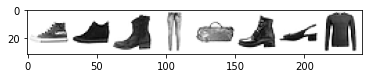

In [ ]:
batch_size = 8

dataset = torchvision.datasets.FashionMNIST(root="fashion_mnist/", train=True, download=True, transform=torchvision.transforms.ToTensor())
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

x, y = next(iter(train_dataloader))
print('Input shape:', x.shape)
print('Labels:', y)
plt.imshow(torchvision.utils.make_grid(x)[0], cmap='Greys')

In [ ]:
num_classes = 10
class_emb_size = 4
w, h = 28, 28

class_emb = nn.Embedding(num_classes, class_emb_size)
class_emb

Embedding(10, 4)

In [ ]:
#input x
x.shape # (batch_size, channels, image_size, image_size) 

torch.Size([8, 1, 28, 28])

In [ ]:
y

tensor([7, 7, 9, 1, 8, 9, 5, 2])

In [ ]:
class_cond = class_emb(y)
class_cond

tensor([[ 5.1115e-02, -5.2779e-01, -5.4185e-01, -5.6901e-01],
        [ 5.1115e-02, -5.2779e-01, -5.4185e-01, -5.6901e-01],
        [ 7.3492e-01,  8.3009e-01, -2.3876e-01, -8.3930e-01],
        [ 1.5430e-01,  2.4533e+00,  1.1663e+00, -2.0782e-01],
        [-6.7750e-01, -3.5663e-01, -8.5705e-01, -8.4995e-01],
        [ 7.3492e-01,  8.3009e-01, -2.3876e-01, -8.3930e-01],
        [ 1.9622e-01,  1.0939e+00, -1.0168e+00, -4.4258e-01],
        [-7.9206e-01, -1.9989e-03,  7.2031e-01, -1.0467e+00]],
       grad_fn=<EmbeddingBackward0>)

In [ ]:
class_cond.shape

torch.Size([8, 4])

In [ ]:
class_cond.view(batch_size, class_cond.shape[1], 1, 1).shape

torch.Size([8, 4, 1, 1])

In [ ]:
class_cond.expand?

In [ ]:
class_cond = class_cond.view(batch_size, class_cond.shape[1], 1, 1).expand(batch_size, class_cond.shape[1], w, h)
class_cond.shape

torch.Size([8, 4, 28, 28])

In [ ]:
x.shape

torch.Size([8, 1, 28, 28])

In [ ]:
torch.cat?

In [ ]:
#All tensors must either have the same shape (except in the concatenating dimension)
torch.cat((x, class_cond), 1).shape

torch.Size([8, 5, 28, 28])

In [ ]:
torch.cat((x, class_cond), 1)

tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0511,  0.0511,  0.0511,  ...,  0.0511,  0.0511,  0.0511],
          [ 0.0511,  0.0511,  0.0511,  ...,  0.0511,  0.0511,  0.0511],
          [ 0.0511,  0.0511,  0.0511,  ...,  0.0511,  0.0511,  0.0511],
          ...,
          [ 0.0511,  0.0511,  0.0511,  ...,  0.0511,  0.0511,  0.0511],
          [ 0.0511,  0.0511,  0.0511,  ...,  0.0511,  0.0511,  0.0511],
          [ 0.0511,  0.0511,  0.0511,  ...,  0.0511,  0.0511,  0.0511]],

         [[-0.5278, -0.5278, -0.5278,  ..., -0.5278, -0.5278, -0.5278],
          [-0.5278, -0.5278, -

In [ ]:
class ClassConditionedUnet(nn.Module):
  def __init__(self, num_classes=10, class_emb_size=4):
    super().__init__()
    
    # The embedding layer will map the class label to a vector of size class_emb_size
    self.class_emb = nn.Embedding(num_classes, class_emb_size)

    # Self.model is an unconditional UNet with extra input channels to accept the conditioning information (the class embedding)
    self.model = UNet2DModel(
        sample_size=28,           # the target image resolution
        in_channels=1 + class_emb_size, # Additional input channels for class cond.
        out_channels=1,           # the number of output channels
        layers_per_block=2,       # how many ResNet layers to use per UNet block
        block_out_channels=(32, 64, 64), 
        down_block_types=( 
            "DownBlock2D",        
            "AttnDownBlock2D",    
            "AttnDownBlock2D",
        ), 
        up_block_types=(
            "AttnUpBlock2D", 
            "AttnUpBlock2D",      
            "UpBlock2D",          
          ),
    )

  # Our forward method now takes the class labels as an additional argument
  def forward(self, x, t, class_labels):
    # Shape of x:
    bs, ch, w, h = x.shape
    
    class_cond = self.class_emb(class_labels) # Map to embedding dinemsion
    class_cond = class_cond.view(bs, class_cond.shape[1], 1, 1).expand(bs, class_cond.shape[1], w, h)
    net_input = torch.cat((x, class_cond), 1) # (bs, 5, 28, 28)

    return self.model(net_input, t).sample # (bs, 1, 28, 28)

In [ ]:
noise_scheduler = DDPMScheduler(num_train_timesteps=1000, beta_schedule='squaredcos_cap_v2')

  0%|          | 0/469 [00:00<?, ?it/s]

Finished epoch 0. Average of the last 100 loss values: 0.086941


  0%|          | 0/469 [00:00<?, ?it/s]

Finished epoch 1. Average of the last 100 loss values: 0.079882


  0%|          | 0/469 [00:00<?, ?it/s]

Finished epoch 2. Average of the last 100 loss values: 0.074064


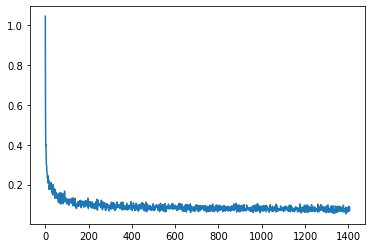

In [ ]:
train_dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

n_epochs = 3 # Only because of time - try 5+
net = ClassConditionedUnet().to(device)

loss_fn = nn.MSELoss()

opt = torch.optim.Adam(net.parameters(), lr=1e-3) 

losses = []

# The training loop
for epoch in range(n_epochs):
    for x, y in tqdm(train_dataloader):
        
        # Get some data and prepare the corrupted version
        x = x.to(device) * 2 - 1 # Data on the GPU (mapped to (-1, 1))
        y = y.to(device)
        noise = torch.randn_like(x)
        timesteps = torch.randint(0, 999, (x.shape[0],)).long().to(device)
        noisy_x = noise_scheduler.add_noise(x, noise, timesteps)

        # Get the model prediction
        pred = net(noisy_x, timesteps, y) # Note that we pass in the labels y

        # Calculate the loss
        loss = loss_fn(pred, noise) # How close is the output to the noise

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print our the average of the last 100 loss values to get an idea of progress:
    avg_loss = sum(losses[-100:])/100
    print(f'Finished epoch {epoch}. Average of the last 100 loss values: {avg_loss:05f}')

# View the loss curve
plt.plot(losses)

In [ ]:
batch_size = 24

In [ ]:
x = torch.randn(batch_size, 1, 28, 28).to(device)
x.shape

torch.Size([24, 1, 28, 28])

In [ ]:
torch.tensor([[3] * batch_size]).shape

torch.Size([1, 24])

In [ ]:
torch.tensor([[3] * batch_size]).flatten().shape

torch.Size([24])

In [ ]:
y = torch.tensor([[3] * batch_size]).flatten().to(device)
y

tensor([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
       device='cuda:0')

0it [00:00, ?it/s]

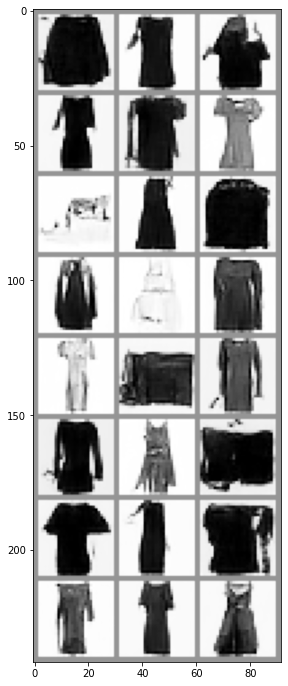

In [ ]:
for i, t in tqdm(enumerate(noise_scheduler.timesteps)):

    # Get model pred
    with torch.no_grad():
        residual = net(x, t, y)  # Again, note that we pass in our labels y

    # Update sample with step
    x = noise_scheduler.step(residual, t, x).prev_sample

# Show the results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax.imshow(torchvision.utils.make_grid(x.detach().cpu().clip(-1, 1), nrow=3)[0], cmap='Greys')

**[Slides - Conditioned models review -> Stable Diffusion]**

# Stable Diffusion


In [ ]:
import torch

pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16).to(device)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

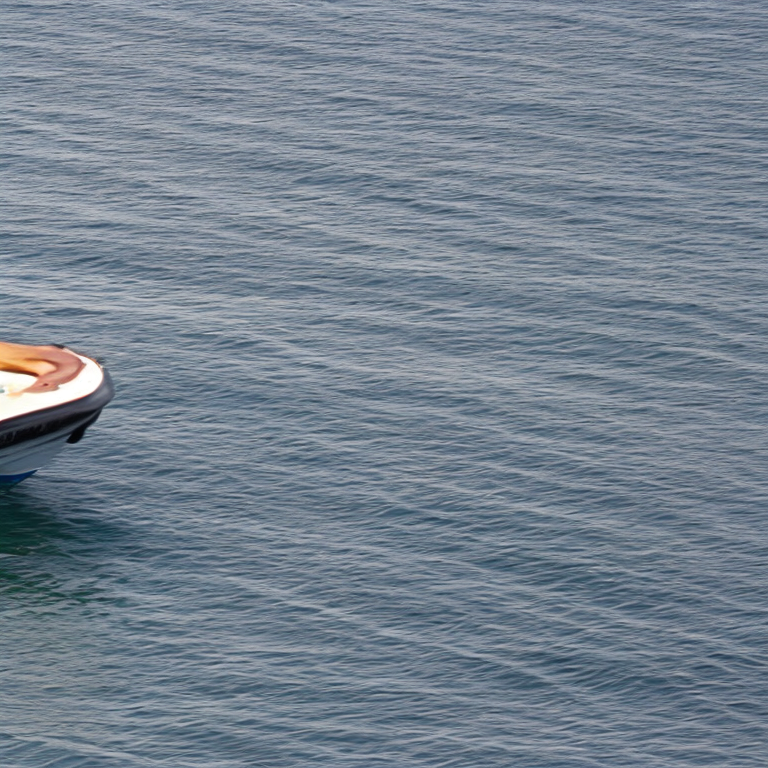

In [ ]:
#Run this multiple times for different images generated each time

prompt = "a photograph of speed boat in the sea with the boat in the centre of the image"
image = pipe(prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

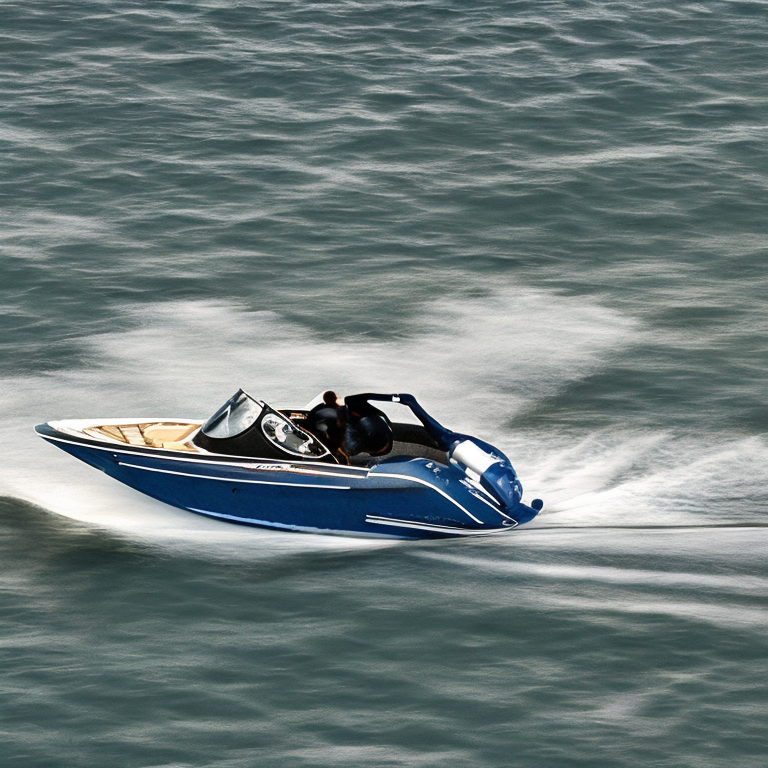

In [ ]:
generator = torch.Generator("cuda").manual_seed(1)
image = pipe(prompt, generator=generator).images[0]
image

  0%|          | 0/15 [00:00<?, ?it/s]

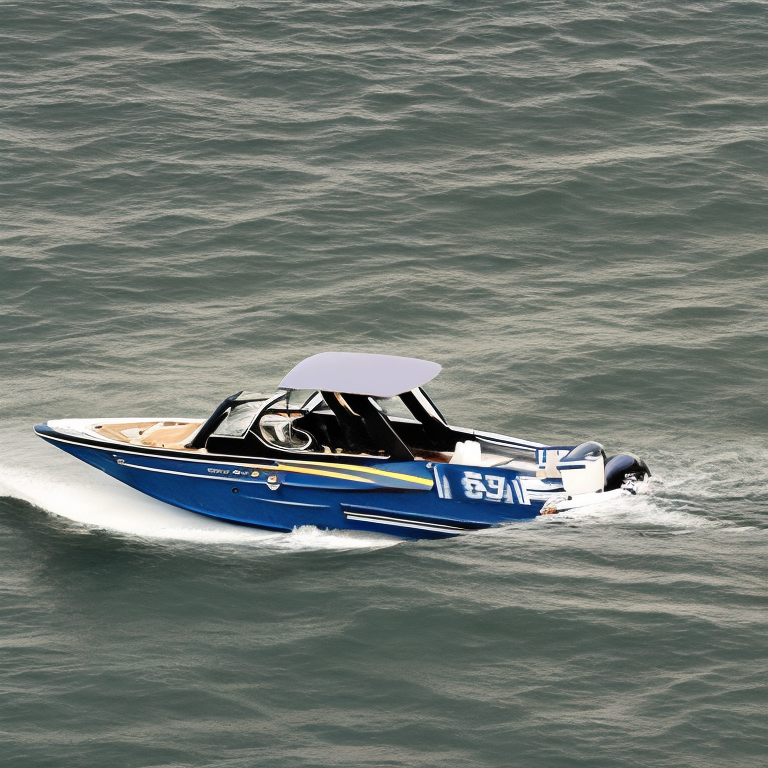

In [ ]:
generator = torch.Generator("cuda").manual_seed(1)
image = pipe(prompt, num_inference_steps=15, generator=generator).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

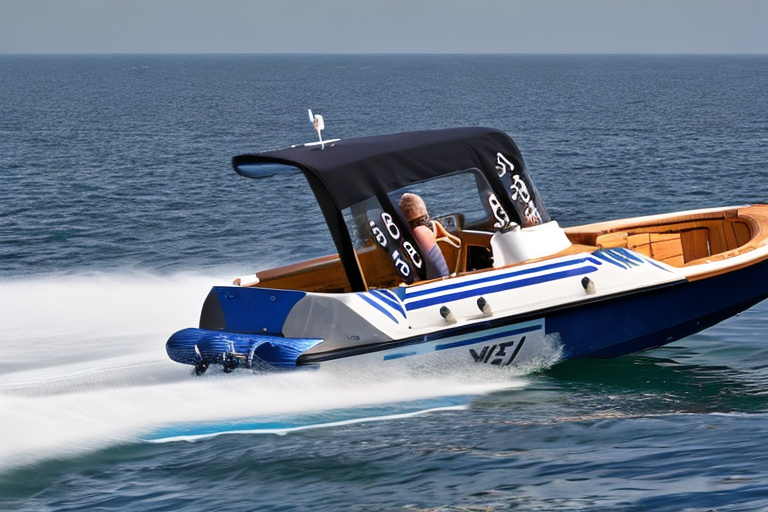

In [ ]:
image = pipe(prompt, height=512, width=768).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

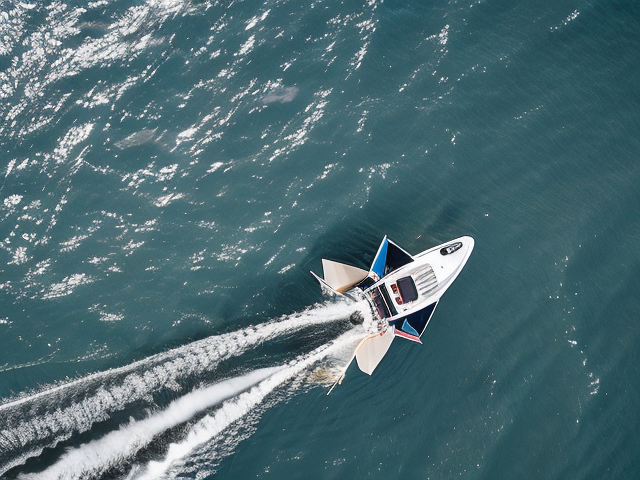

In [ ]:
generator = torch.Generator(device=device).manual_seed(1)

pipe_output = pipe(
    prompt=prompt, 
    negative_prompt="Oversaturated, blurry, low quality, painting", 
    height=480, width=640,     
    guidance_scale=8,          
    num_inference_steps=50
)

pipe_output.images[0]

**[Slides - Stable diffusion]**

## Auto-encoder

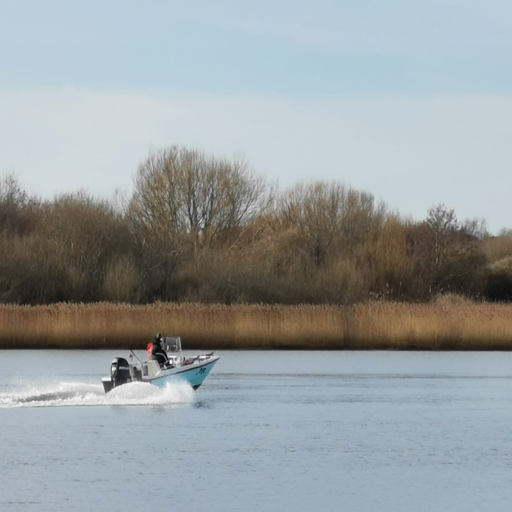

In [ ]:
url = "https://github.com/jonfernandes/images/raw/main/boat.jpeg"

def download_image(url):
  return Image.open(requests.get(url, stream=True).raw).convert("RGB")

input_image = download_image(url).resize((512, 512))
input_image

- We want to go from image to latent so 3x512x512 to 1x4x64x64

In [ ]:
transforms.ToTensor()(input_image).shape

torch.Size([3, 512, 512])

In [ ]:
transforms.ToTensor()(input_image).unsqueeze(0).shape

torch.Size([1, 3, 512, 512])

In [ ]:
transforms.ToTensor()(input_image).unsqueeze(0).to(device)

tensor([[[[0.7412, 0.7412, 0.7412,  ..., 0.7333, 0.7333, 0.7333],
          [0.7412, 0.7412, 0.7412,  ..., 0.7333, 0.7333, 0.7333],
          [0.7412, 0.7412, 0.7412,  ..., 0.7333, 0.7333, 0.7333],
          ...,
          [0.6588, 0.6510, 0.6510,  ..., 0.6275, 0.6157, 0.6196],
          [0.6510, 0.6471, 0.6431,  ..., 0.6275, 0.6196, 0.6235],
          [0.6353, 0.6314, 0.6275,  ..., 0.6275, 0.6235, 0.6235]],

         [[0.8118, 0.8118, 0.8118,  ..., 0.8039, 0.8039, 0.8039],
          [0.8118, 0.8118, 0.8118,  ..., 0.8039, 0.8039, 0.8039],
          [0.8118, 0.8118, 0.8118,  ..., 0.8039, 0.8039, 0.8039],
          ...,
          [0.7098, 0.7020, 0.7020,  ..., 0.6902, 0.6784, 0.6824],
          [0.7020, 0.6980, 0.6941,  ..., 0.6902, 0.6824, 0.6863],
          [0.6863, 0.6824, 0.6784,  ..., 0.6902, 0.6863, 0.6863]],

         [[0.8667, 0.8667, 0.8667,  ..., 0.8588, 0.8588, 0.8588],
          [0.8667, 0.8667, 0.8667,  ..., 0.8588, 0.8588, 0.8588],
          [0.8667, 0.8667, 0.8667,  ..., 0

In [ ]:
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae").to(device)

The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


In [ ]:
vae.encode(transforms.ToTensor()(input_image).unsqueeze(0).to(device)*2-1)

AutoencoderKLOutput(latent_dist=<diffusers.models.vae.DiagonalGaussianDistribution object at 0x7f0aa48af670>)

In [ ]:
latent = vae.encode(transforms.ToTensor()(input_image).unsqueeze(0).to(device)*2-1)

In [ ]:
latent.latent_dist?

In [ ]:
latent.latent_dist.sample?

In [ ]:
latent.latent_dist.sample().shape

torch.Size([1, 4, 64, 64])

- Researchers scaled latents by 0.18215 from stable diffusion paper

In [ ]:
def image_to_latent(input_im):
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(transforms.ToTensor()(input_im).unsqueeze(0).to(device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()

encoded = image_to_latent(input_image)
encoded.shape

torch.Size([1, 4, 64, 64])

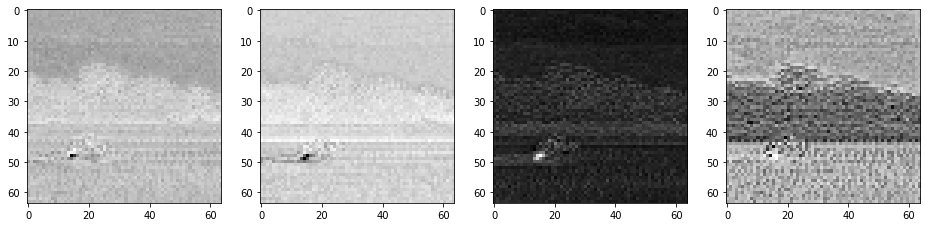

In [ ]:
#4 here is the 4 channels of the latent representation
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(encoded[0][c].cpu(), cmap='Greys')

Latents dimension: torch.Size([1, 4, 64, 64])


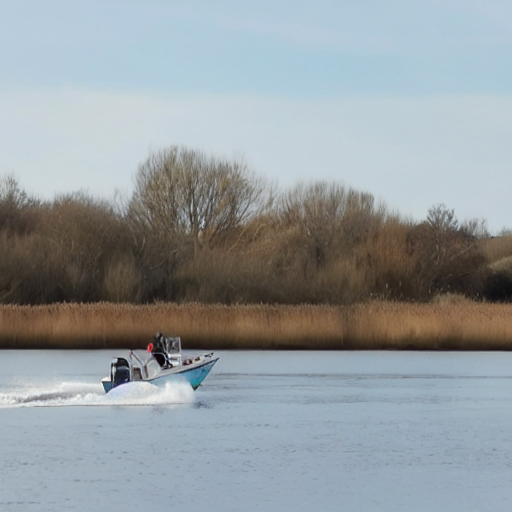

In [ ]:
def latents_to_images(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    all_images = [Image.fromarray(image) for image in images]
    return all_images

print(f"Latents dimension: {encoded.shape}")
latents_to_images(encoded)[0]

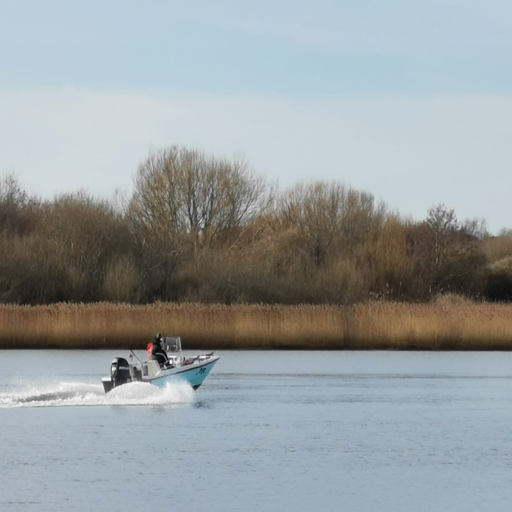

In [ ]:
#original image
input_image

## Scheduler

In [ ]:
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)
scheduler.set_timesteps(15)

In [ ]:
scheduler.timesteps

tensor([999.0000, 927.6429, 856.2857, 784.9286, 713.5714, 642.2143, 570.8571,
        499.5000, 428.1429, 356.7857, 285.4286, 214.0714, 142.7143,  71.3571,
          0.0000], dtype=torch.float64)

In [ ]:
#sigma is noise
scheduler.sigmas

tensor([14.6146,  9.6826,  6.6780,  4.7746,  3.5221,  2.6666,  2.0606,  1.6156,
         1.2768,  1.0097,  0.7913,  0.6056,  0.4397,  0.2780,  0.0292,  0.0000])

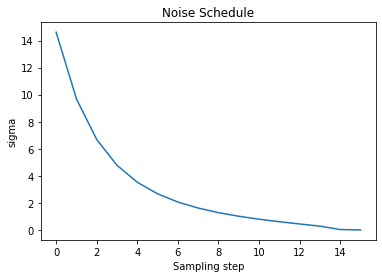

In [ ]:
plt.plot(scheduler.sigmas)
plt.title('Noise Schedule')
plt.xlabel('Sampling step')
plt.ylabel('sigma')
plt.show()

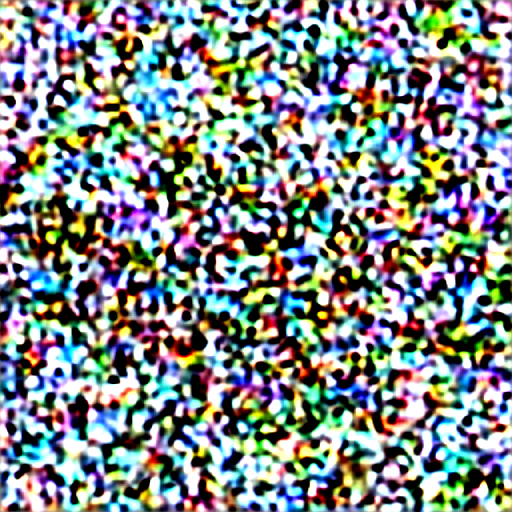

In [ ]:
noise = torch.randn_like(encoded) 
sampling_step = 2 # Equivalent to step 10 out of 15 in the schedule above
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
latents_to_images(encoded_and_noised.float())[0]

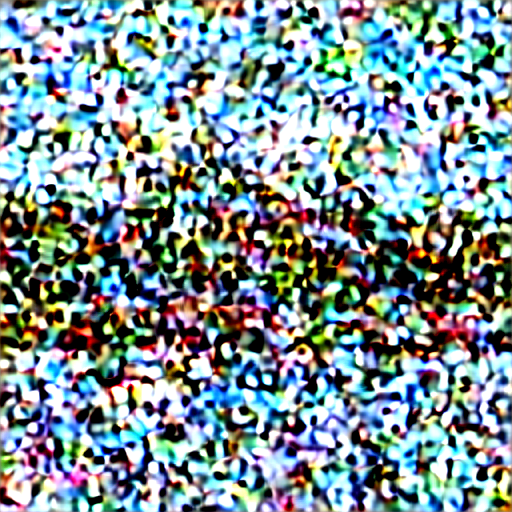

In [ ]:
noise = torch.randn_like(encoded) 
sampling_step = 5 # Equivalent to step 10 out of 15 in the schedule above
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
latents_to_images(encoded_and_noised.float())[0]

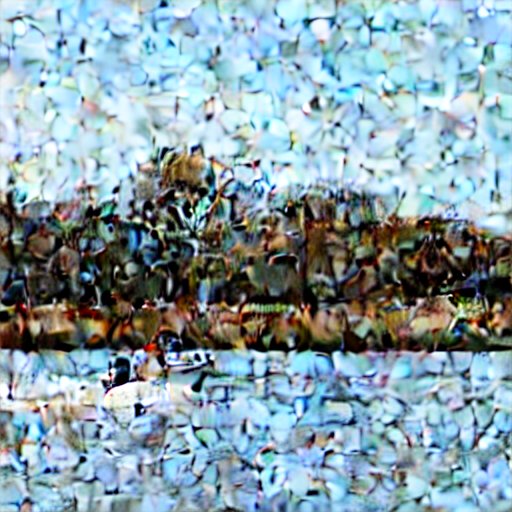

In [ ]:
noise = torch.randn_like(encoded) 
sampling_step = 10 # Equivalent to step 10 out of 15 in the schedule above
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
latents_to_images(encoded_and_noised.float())[0]

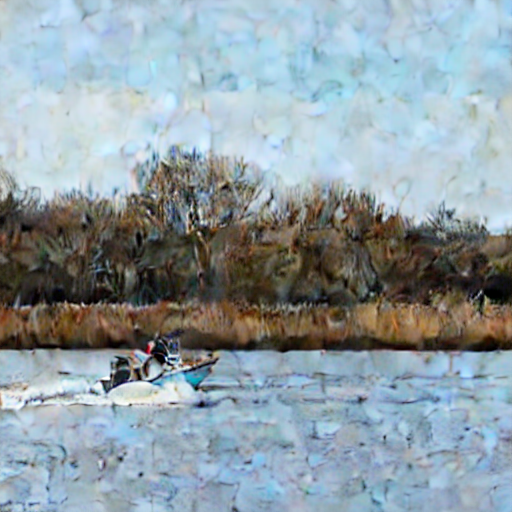

In [ ]:
noise = torch.randn_like(encoded) 
sampling_step = 12 # Equivalent to step 10 out of 15 in the schedule above
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
latents_to_images(encoded_and_noised.float())[0]

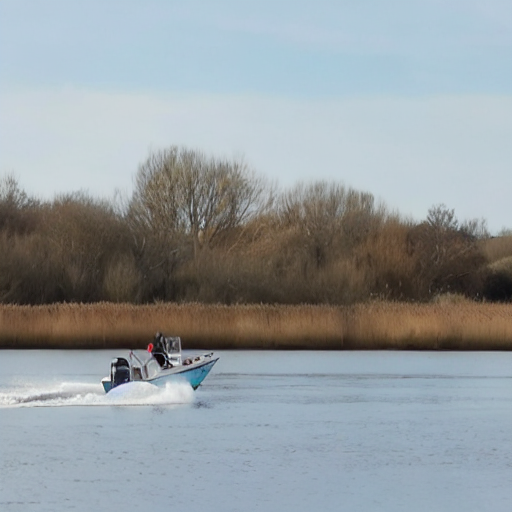

In [ ]:
noise = torch.randn_like(encoded) 
sampling_step = 14 # Equivalent to step 10 out of 15 in the schedule above
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
latents_to_images(encoded_and_noised.float())[0]

In [ ]:
scheduler.add_noise??

**[Slides: Text encoder - CLIP]**

## CLIP Model

In [ ]:
model_id = "openai/clip-vit-large-patch14"

model = CLIPModel.from_pretrained(model_id)
tokenizer = CLIPProcessor.from_pretrained(model_id)

In [ ]:
inp = tokenizer(["a photo of a boat", "a photo of a dolphin"], images=input_image, return_tensors="pt")
inp

{'input_ids': tensor([[49406,   320,  1125,   539,   320,  4440, 49407],
        [49406,   320,  1125,   539,   320, 16464, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1],
        [1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[0.9668, 0.9522, 0.9668,  ..., 0.9376, 0.9376, 0.9376],
          [0.9522, 0.9522, 0.9522,  ..., 0.9522, 0.9522, 0.9376],
          [0.9522, 0.9522, 0.9522,  ..., 0.9522, 0.9522, 0.9376],
          ...,
          [0.5435, 0.4997, 0.5289,  ..., 0.5435, 0.5435, 0.5435],
          [0.6311, 0.6165, 0.6019,  ..., 0.5289, 0.5289, 0.5289],
          [0.6019, 0.5581, 0.5581,  ..., 0.5289, 0.5435, 0.5289]],

         [[1.3545, 1.3395, 1.3545,  ..., 1.3245, 1.3245, 1.3245],
          [1.3395, 1.3395, 1.3395,  ..., 1.3395, 1.3395, 1.3245],
          [1.3395, 1.3395, 1.3395,  ..., 1.3395, 1.3395, 1.3245],
          ...,
          [0.8442, 0.7992, 0.8292,  ..., 0.8893, 0.8893, 0.8893],
          [0.9343, 0.9193, 0.9043,  ..., 0.8743, 0.8743, 0.8743],
          

In [ ]:
outp = model(**inp)
outp

CLIPOutput(loss=None, logits_per_image=tensor([[19.2173, 15.3004]], grad_fn=<TBackward0>), logits_per_text=tensor([[19.2173],
        [15.3004]], grad_fn=<MulBackward0>), text_embeds=tensor([[-0.0260, -0.0134,  0.0062,  ...,  0.0306,  0.0170, -0.0194],
        [ 0.0249,  0.0062,  0.0022,  ...,  0.0060, -0.0012, -0.0220]],
       grad_fn=<DivBackward0>), image_embeds=tensor([[ 4.5385e-02,  1.9700e-02, -1.0597e-02, -7.3953e-02, -3.3074e-03,
         -1.9444e-02, -6.9537e-03, -2.1151e-02, -6.3454e-04, -3.2495e-03,
         -3.4027e-02, -3.9497e-03,  1.4921e-02, -5.0271e-02,  2.9906e-02,
          1.7112e-02,  5.0224e-03, -3.2455e-02,  4.9281e-03, -1.3986e-02,
         -3.8815e-02,  2.2343e-02,  4.0858e-02,  2.7271e-02, -2.2891e-02,
         -1.1331e-02, -1.0284e-02,  3.2792e-02,  4.9240e-03,  1.5152e-02,
         -3.5080e-02, -5.1127e-03, -2.3067e-02, -1.1474e-02,  9.1932e-03,
          1.1330e-02,  2.9681e-03, -2.0675e-02,  1.9334e-03,  4.3519e-03,
          2.5574e-03,  1.3562e-02,  1.6

In [ ]:
outp.logits_per_image

tensor([[19.2173, 15.3004]], grad_fn=<TBackward0>)

In [ ]:
torch.nn.functional.softmax(outp.logits_per_image, dim=-1)

tensor([[0.9805, 0.0195]], grad_fn=<SoftmaxBackward0>)

## Tokenizer

In [ ]:
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")

In [ ]:
tokenizer.vocab_size

49408

In [ ]:
tokenizer.get_vocab()

{'!': 0,
 '"': 1,
 '#': 2,
 '$': 3,
 '%': 4,
 '&': 5,
 "'": 6,
 '(': 7,
 ')': 8,
 '*': 9,
 '+': 10,
 ',': 11,
 '-': 12,
 '.': 13,
 '/': 14,
 '0': 15,
 '1': 16,
 '2': 17,
 '3': 18,
 '4': 19,
 '5': 20,
 '6': 21,
 '7': 22,
 '8': 23,
 '9': 24,
 ':': 25,
 ';': 26,
 '<': 27,
 '=': 28,
 '>': 29,
 '?': 30,
 '@': 31,
 'A': 32,
 'B': 33,
 'C': 34,
 'D': 35,
 'E': 36,
 'F': 37,
 'G': 38,
 'H': 39,
 'I': 40,
 'J': 41,
 'K': 42,
 'L': 43,
 'M': 44,
 'N': 45,
 'O': 46,
 'P': 47,
 'Q': 48,
 'R': 49,
 'S': 50,
 'T': 51,
 'U': 52,
 'V': 53,
 'W': 54,
 'X': 55,
 'Y': 56,
 'Z': 57,
 '[': 58,
 '\\': 59,
 ']': 60,
 '^': 61,
 '_': 62,
 '`': 63,
 'a': 64,
 'b': 65,
 'c': 66,
 'd': 67,
 'e': 68,
 'f': 69,
 'g': 70,
 'h': 71,
 'i': 72,
 'j': 73,
 'k': 74,
 'l': 75,
 'm': 76,
 'n': 77,
 'o': 78,
 'p': 79,
 'q': 80,
 'r': 81,
 's': 82,
 't': 83,
 'u': 84,
 'v': 85,
 'w': 86,
 'x': 87,
 'y': 88,
 'z': 89,
 '{': 90,
 '|': 91,
 '}': 92,
 '~': 93,
 '¡': 94,
 '¢': 95,
 '£': 96,
 '¤': 97,
 '¥': 98,
 '¦': 99,
 '§': 100

In [ ]:
len(tokenizer.get_vocab())

49408

In [ ]:
tokenizer.special_tokens_map

{'bos_token': '<|startoftext|>',
 'eos_token': '<|endoftext|>',
 'unk_token': '<|endoftext|>',
 'pad_token': '<|endoftext|>'}

In [ ]:
tokenizer.bos_token_id

49406

In [ ]:
tokenizer.eos_token_id

49407

In [ ]:
tokenizer.pad_token_id

49407

In [ ]:
prompt = "boat on the sea"
inp = tokenizer(prompt)
inp

{'input_ids': [49406, 4440, 525, 518, 2102, 49407], 'attention_mask': [1, 1, 1, 1, 1, 1]}

In [ ]:
tokenizer.convert_ids_to_tokens(inp["input_ids"])

['<|startoftext|>',
 'boat</w>',
 'on</w>',
 'the</w>',
 'sea</w>',
 '<|endoftext|>']

In [ ]:
inp = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
inp

{'input_ids': tensor([[49406,  4440,   525,   518,  2102, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [ ]:
inp["input_ids"].shape

torch.Size([1, 77])

In [ ]:
tokenizer.batch_decode(inp["input_ids"])

['<|startoftext|>boat on the sea <|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']

- We pass tokens to the text_encoder.
- What are the components of a text encoder?

**[Slides: Text encoders]**

## Text encoder

In [ ]:
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
text_encoder

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.3.mlp.fc1.bias', 'vision_model.post_layernorm.bias', 'vision_model.encoder.layers.22.mlp.fc2.weight', 'vision_model.encoder.layers.20.mlp.fc1.weight', 'vision_model.encoder.layers.12.self_attn.out_proj.bias', 'vision_model.encoder.layers.7.self_attn.k_proj.bias', 'vision_model.encoder.layers.4.mlp.fc1.weight', 'vision_model.encoder.layers.10.layer_norm1.bias', 'vision_model.encoder.layers.11.self_attn.out_proj.weight', 'vision_model.encoder.layers.9.self_attn.v_proj.bias', 'vision_model.encoder.layers.17.self_attn.q_proj.weight', 'vision_model.encoder.layers.17.self_attn.q_proj.bias', 'vision_model.encoder.layers.8.layer_norm2.bias', 'vision_model.encoder.layers.11.self_attn.q_proj.weight', 'vision_model.encoder.layers.12.layer_norm1.bias', 'vision_model.encoder.layers.0.layer_norm1.weight', 'vision_model.encoder.layers.12.layer_norm2.bias',

CLIPTextModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0): CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, ele

In [ ]:
text_encoder.text_model.embeddings

CLIPTextEmbeddings(
  (token_embedding): Embedding(49408, 768)
  (position_embedding): Embedding(77, 768)
)

In [ ]:
text_encoder.text_model.embeddings.token_embedding

Embedding(49408, 768)

In [ ]:
tokenizer("boat")

{'input_ids': [49406, 4440, 49407], 'attention_mask': [1, 1, 1]}

In [ ]:
text_encoder.text_model.embeddings.token_embedding(torch.tensor(4440, device=device))

tensor([ 1.1293e-03, -2.0220e-02, -2.4499e-02, -2.4995e-02,  1.0847e-02,
         2.9081e-03, -1.1571e-03, -1.9174e-02, -3.5550e-02,  1.3623e-02,
        -4.9988e-03, -1.0953e-02, -3.6990e-03, -9.2991e-03,  1.2195e-02,
         4.5792e-03,  2.5516e-02,  2.8520e-03, -5.9133e-03,  6.7199e-03,
        -1.2741e-02, -1.9465e-02,  2.4131e-02, -1.3685e-02, -1.2976e-02,
        -1.5846e-02,  6.3901e-03,  2.5926e-02, -1.7287e-03, -2.2321e-03,
        -6.4420e-03, -2.0436e-03,  9.0470e-04,  4.7812e-03, -1.3264e-02,
        -7.8111e-03,  1.4853e-02,  1.0331e-02,  1.7524e-03, -6.0407e-03,
        -3.1537e-03,  5.7733e-03, -2.2986e-02,  4.9187e-03,  1.6811e-02,
         9.2330e-03, -1.0814e-02,  1.0629e-02, -1.5638e-02, -9.5634e-03,
        -1.8373e-03, -3.4853e-03,  7.9816e-03,  2.2770e-02, -9.2901e-03,
        -1.3656e-03,  1.2389e-02,  4.3342e-04,  1.7086e-02, -2.6025e-03,
        -3.2295e-04, -1.7125e-02, -1.0895e-02,  4.6344e-03,  1.9879e-02,
        -2.4786e-02, -6.8871e-03,  2.7351e-02, -2.7

In [ ]:
text_encoder.text_model.embeddings.token_embedding(torch.tensor(4440, device=device)).shape

torch.Size([768])

In [ ]:
text_encoder.text_model.embeddings.token_embedding(torch.tensor(inp["input_ids"], device=device)).shape

torch.Size([1, 77, 768])

Position embedding

In [ ]:
text_encoder.text_model.embeddings.position_embedding

Embedding(77, 768)

- Image with token embedding, positional embedding 

**[slides - Textual Inversion]**

## Textual inversion

In [ ]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

model_id = "CompVis/stable-diffusion-v1-4"

In [ ]:
from IPython.display import Markdown
from huggingface_hub import hf_hub_download

repo_id_embeds = "sd-concepts-library/herge-style"

In [ ]:
embeds_url = "" #Add the URL or path to a learned_embeds.bin file in case you have one
placeholder_token_string = "" #Add what is the token string in case you are uploading your own embed

downloaded_embedding_folder = "./downloaded_embedding"
if not os.path.exists(downloaded_embedding_folder):
  os.mkdir(downloaded_embedding_folder)
if not embeds_url:
  embeds_path = hf_hub_download(repo_id=repo_id_embeds, filename="learned_embeds.bin")
  token_path = hf_hub_download(repo_id=repo_id_embeds, filename="token_identifier.txt")
  !cp $embeds_path $downloaded_embedding_folder
  !cp $token_path $downloaded_embedding_folder
  with open(f'{downloaded_embedding_folder}/token_identifier.txt', 'r') as file:
    placeholder_token_string = file.read()
else:
  !wget -q -O $downloaded_embedding_folder/learned_embeds.bin $embeds_url

learned_embeds_path = f"{downloaded_embedding_folder}/learned_embeds.bin"

print(f"The placeholder token for the concept is {placeholder_token_string}")

The placeholder token for the concept is <herge>


In [ ]:
!ls -l downloaded_embedding

total 8
-rw-r--r-- 1 root root 3819 Feb 27 05:47 learned_embeds.bin
-rw-r--r-- 1 root root    7 Feb 27 05:47 token_identifier.txt


In [ ]:
!cat downloaded_embedding/token_identifier.txt

<herge>

In [ ]:
tokenizer = CLIPTokenizer.from_pretrained(
    model_id,
    subfolder="tokenizer",
)
text_encoder = CLIPTextModel.from_pretrained(
    model_id, subfolder="text_encoder", torch_dtype=torch.float16
)

In [ ]:
learned_embeds_path

'./downloaded_embedding/learned_embeds.bin'

In [ ]:
loaded_learned_embeds = torch.load(learned_embeds_path, map_location="cpu")
loaded_learned_embeds

{'<herge>': tensor([ 4.7965e-03, -1.4111e-01, -8.0943e-02,  1.0695e-01,  1.0737e-01,
          2.9284e-02, -1.4268e-01, -3.3240e-02,  1.3736e-01,  1.7868e-01,
          8.9592e-02,  2.6462e-02, -2.4411e-02, -1.0912e-01, -6.5175e-03,
         -1.6605e-01, -1.1617e-01, -2.1677e-01,  8.4490e-03,  5.7784e-02,
         -1.2187e-01,  2.7614e-01,  1.2748e-01, -8.2205e-02,  2.9057e-02,
         -1.3721e-01, -8.9172e-02,  6.3647e-02,  6.7829e-02, -5.1429e-02,
          1.4736e-02,  4.6403e-02,  1.0755e-01, -1.3785e-02,  7.3753e-02,
          1.2245e-01, -1.0372e-01, -5.8882e-02, -1.4905e-01,  2.7267e-02,
         -8.0921e-02,  1.7283e-02, -2.2103e-02,  2.7134e-01, -3.1844e-02,
         -1.1972e-02, -6.4107e-02, -2.1305e-01,  1.5921e-01, -1.6643e-01,
         -1.4590e-01, -1.0406e-01,  3.4224e-02,  8.7227e-02, -4.1539e-02,
          1.5026e-01,  8.0444e-02,  1.3173e-02,  1.3086e-01,  2.4821e-02,
          5.5799e-02, -9.1459e-02,  1.2868e-02, -1.3053e-01,  4.4674e-02,
          4.5641e-02,  1.14

In [ ]:
trained_token, embeds = list(loaded_learned_embeds.items())[0]

In [ ]:
text_encoder.get_input_embeddings().weight.dtype

torch.float16

In [ ]:
text_encoder_dtype = text_encoder.get_input_embeddings().weight.dtype
text_encoder_dtype

torch.float16

In [ ]:
embeds.to(text_encoder_dtype)

tensor([ 4.7951e-03, -1.4111e-01, -8.0933e-02,  1.0693e-01,  1.0736e-01,
         2.9282e-02, -1.4270e-01, -3.3234e-02,  1.3733e-01,  1.7871e-01,
         8.9600e-02,  2.6459e-02, -2.4414e-02, -1.0913e-01, -6.5193e-03,
        -1.6602e-01, -1.1615e-01, -2.1680e-01,  8.4457e-03,  5.7770e-02,
        -1.2189e-01,  2.7612e-01,  1.2744e-01, -8.2214e-02,  2.9053e-02,
        -1.3721e-01, -8.9172e-02,  6.3660e-02,  6.7810e-02, -5.1422e-02,
         1.4740e-02,  4.6417e-02,  1.0754e-01, -1.3786e-02,  7.3730e-02,
         1.2244e-01, -1.0370e-01, -5.8868e-02, -1.4905e-01,  2.7267e-02,
        -8.0933e-02,  1.7288e-02, -2.2110e-02,  2.7124e-01, -3.1830e-02,
        -1.1971e-02, -6.4087e-02, -2.1301e-01,  1.5918e-01, -1.6638e-01,
        -1.4587e-01, -1.0406e-01,  3.4210e-02,  8.7219e-02, -4.1534e-02,
         1.5027e-01,  8.0444e-02,  1.3176e-02,  1.3086e-01,  2.4826e-02,
         5.5786e-02, -9.1431e-02,  1.2871e-02, -1.3049e-01,  4.4678e-02,
         4.5654e-02,  1.1407e-01, -5.0171e-02, -7.1

In [ ]:
token = trained_token
token

'<herge>'

In [ ]:
#We need to add this new "style" to our tokenizer
num_added_tokens = tokenizer.add_tokens(token)
num_added_tokens

1

In [ ]:
#resize the token embeddings
text_encoder.resize_token_embeddings(len(tokenizer))

Embedding(49409, 768)

In [ ]:
len(tokenizer.get_vocab())

49409

In [ ]:
token_id = tokenizer.convert_tokens_to_ids(token)
token_id

49408

In [ ]:
text_encoder.get_input_embeddings()

Embedding(49409, 768)

In [ ]:
#Assign token_id to embeddings
text_encoder.get_input_embeddings().weight.data[token_id] = embeds


In [ ]:
tokenizer = CLIPTokenizer.from_pretrained(
    model_id,
    subfolder="tokenizer",
)
text_encoder = CLIPTextModel.from_pretrained(
    model_id, subfolder="text_encoder", torch_dtype=torch.float16
)

def load_learned_embed_in_clip(learned_embeds_path, text_encoder, tokenizer, token=None):
  loaded_learned_embeds = torch.load(learned_embeds_path, map_location="cpu")
  
  trained_token = list(loaded_learned_embeds.keys())[0]
  embeds = loaded_learned_embeds[trained_token]

  dtype = text_encoder.get_input_embeddings().weight.dtype
  embeds.to(dtype)

  token = token if token is not None else trained_token
  num_added_tokens = tokenizer.add_tokens(token)
  if num_added_tokens == 0:
    raise ValueError(f"The tokenizer already contains the token {token}. Please pass a different `token` that is not already in the tokenizer.")
  
  text_encoder.resize_token_embeddings(len(tokenizer))
  
  token_id = tokenizer.convert_tokens_to_ids(token)
  text_encoder.get_input_embeddings().weight.data[token_id] = embeds

load_learned_embed_in_clip(learned_embeds_path, text_encoder, tokenizer)

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    text_encoder=text_encoder,
    tokenizer=tokenizer,
).to(device)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

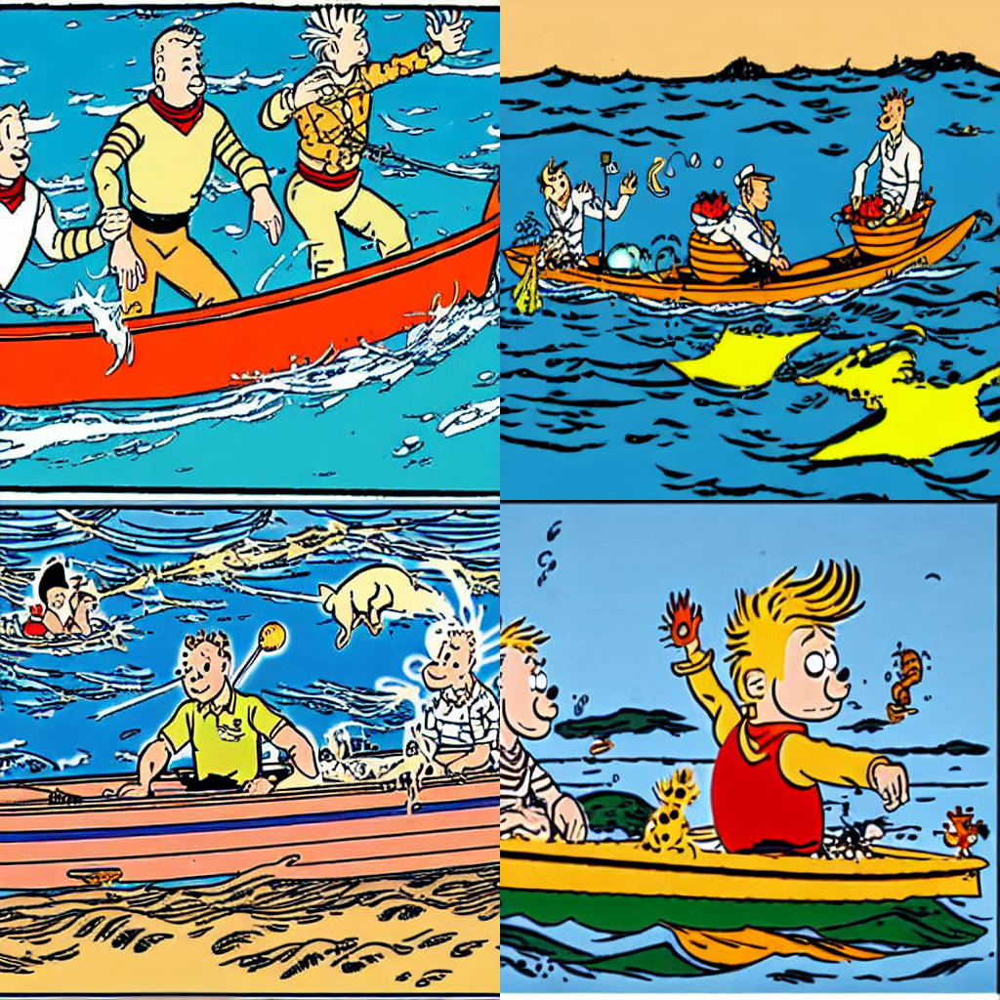

In [ ]:
prompt = "A boat on the sea in the style of <herge>" 
num_samples = 2 
num_rows = 2 

all_images = [] 
for _ in range(num_rows):
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid

[END]